In [1]:
# ========================= PHASE 1 ===================================


import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns



data1 = pd.read_csv("Data/01_District_wise_crimes_committed_IPC_2001_2012.csv")
data2 = pd.read_csv("Data/02_01_District_wise_crimes_committed_against_SC_2001_2012.csv")
data3 = pd.read_csv("Data/02_District_wise_crimes_committed_against_ST_2001_2012.csv")
data4 = pd.read_csv("Data/03_District_wise_crimes_committed_against_children_2001_2012.csv")
data5 = pd.read_csv("Data/08_01_Juvenile_apprehended_state_IPC_2001_2010.csv")
data6 = pd.read_csv("Data/11_Property_stolen_and_recovered_nature_of_property_2001_2010.csv")
data7 = pd.read_csv("Data/13_Police_killed_or_injured_on_duty2001_2010.csv")
data8= pd.read_csv("Data/17_Case_reported_and_value_of_property_taken_away_by_place_of_occurrence_2001_2012.csv")
data8= pd.read_csv("Data/17_Crime_by_place_of_occurrence_2001_2012.csv")
data9= pd.read_csv("Data/35_Human_rights_violation_by_police_2001_2010.csv")
data9= pd.read_csv("Data/42_District_wise_crimes_committed_against_women_2001_2012.csv")



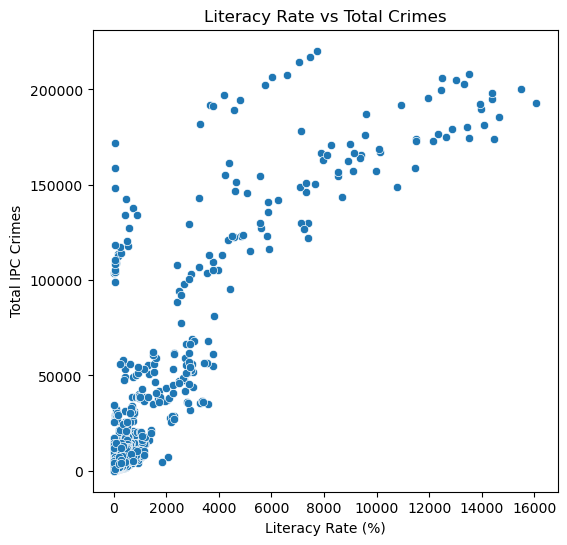

-----------------------------------------------------------------------


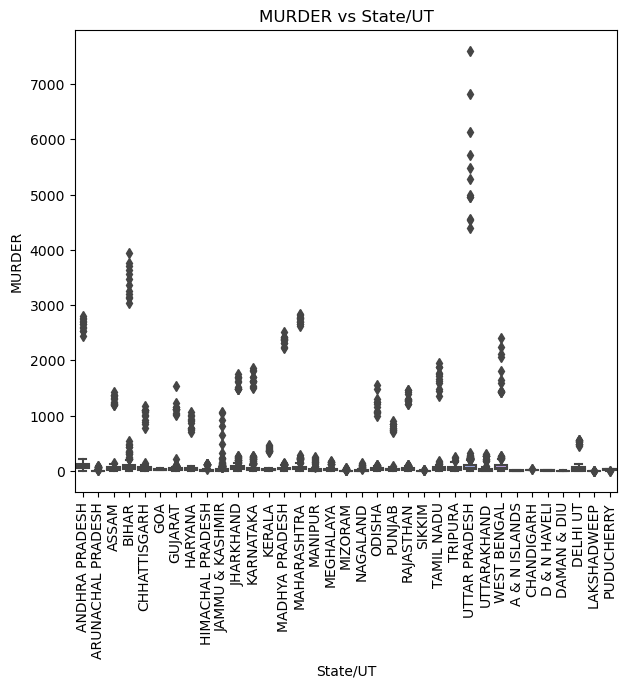

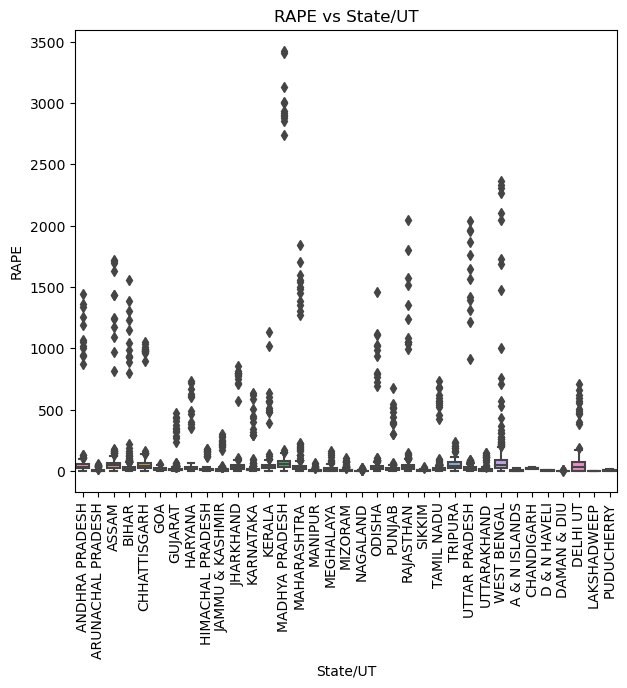

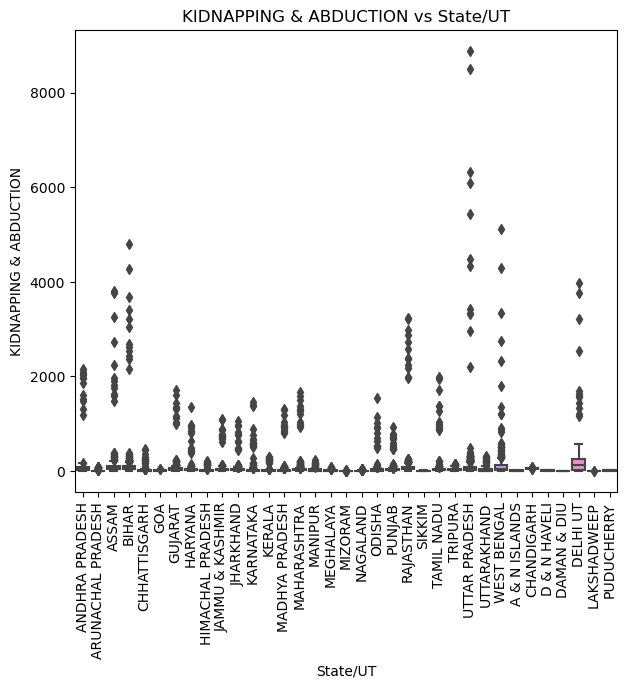

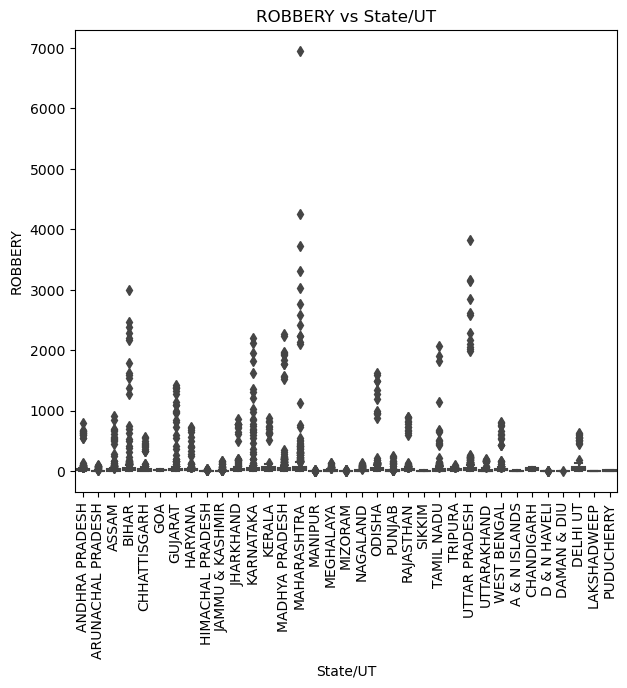

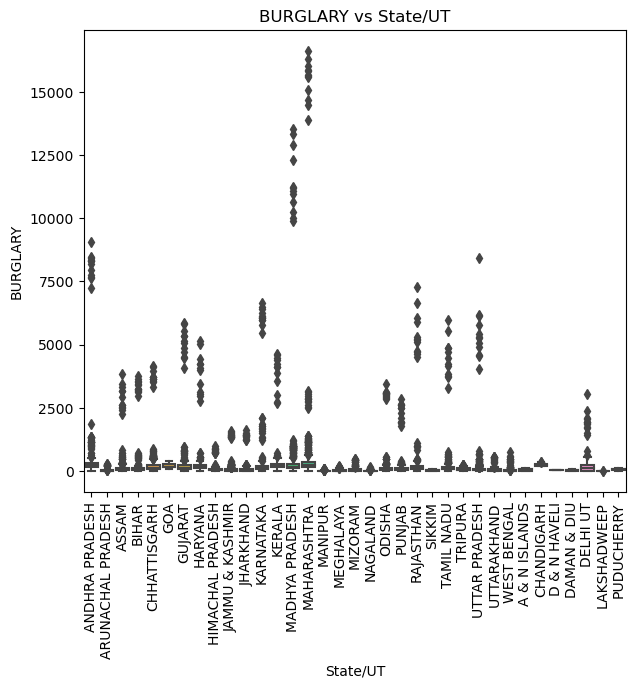

-----------------------------------------------------------------------


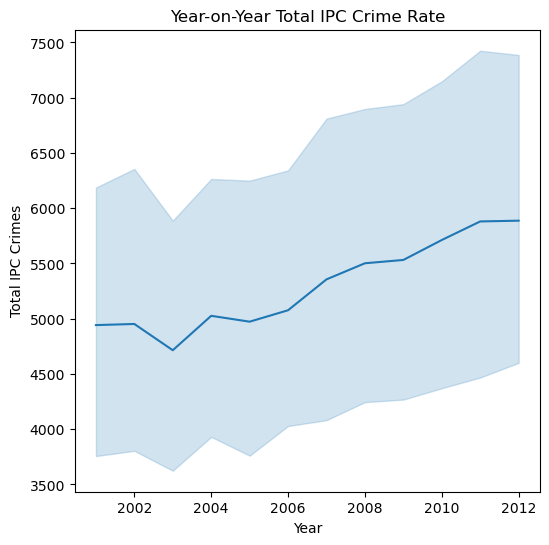

-----------------------------------------------------------------------


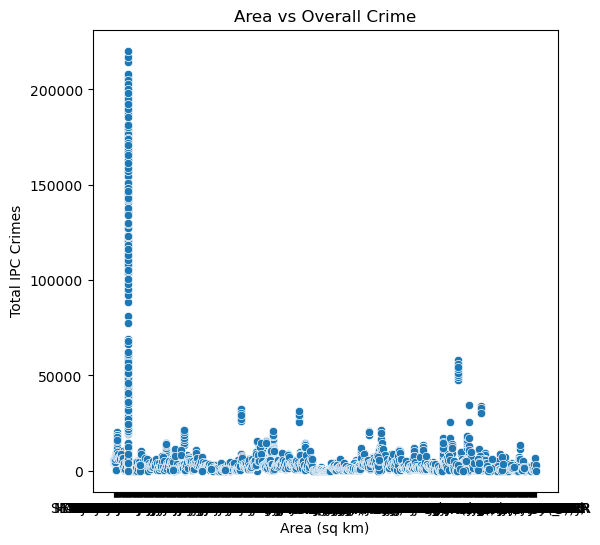

-----------------------------------------------------------------------


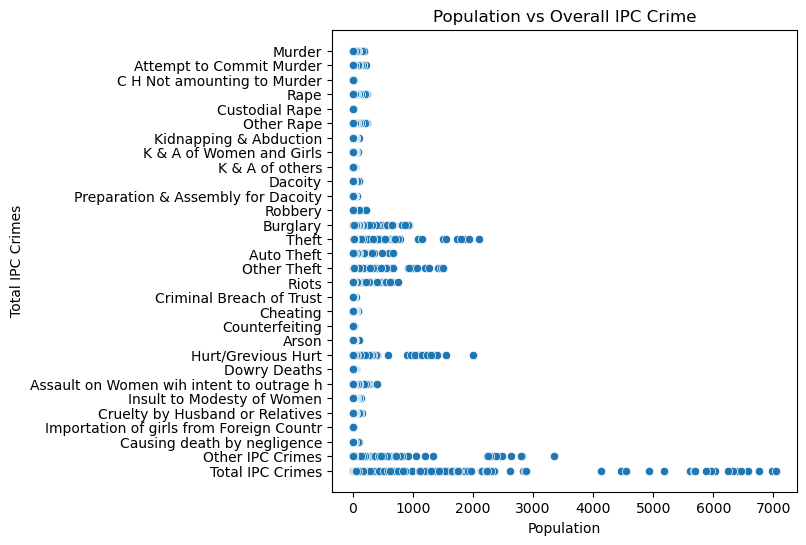

-----------------------------------------------------------------------


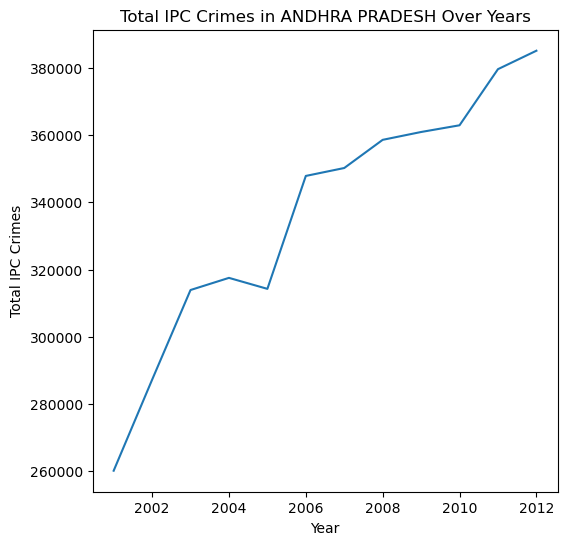

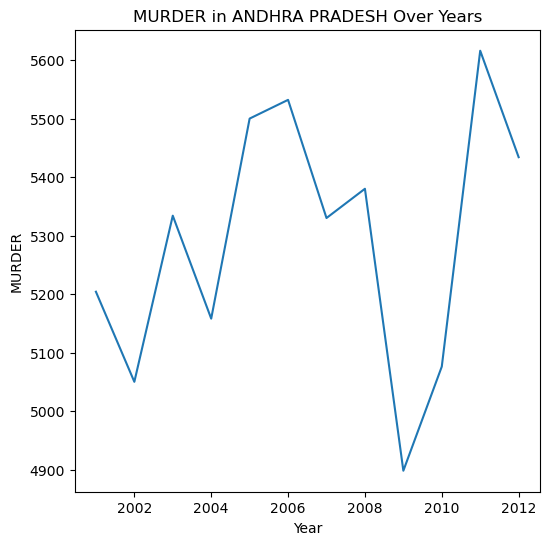

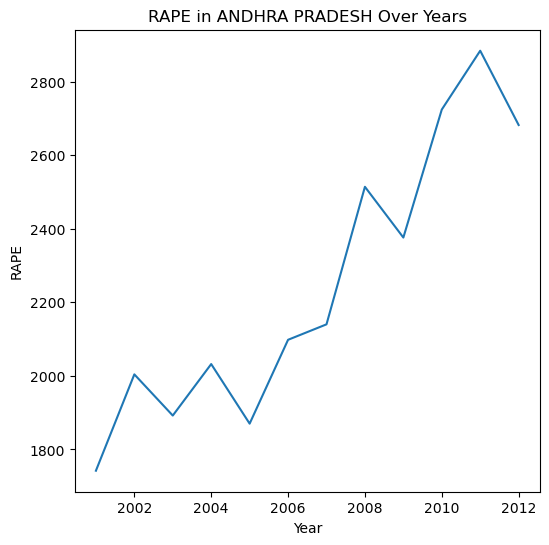

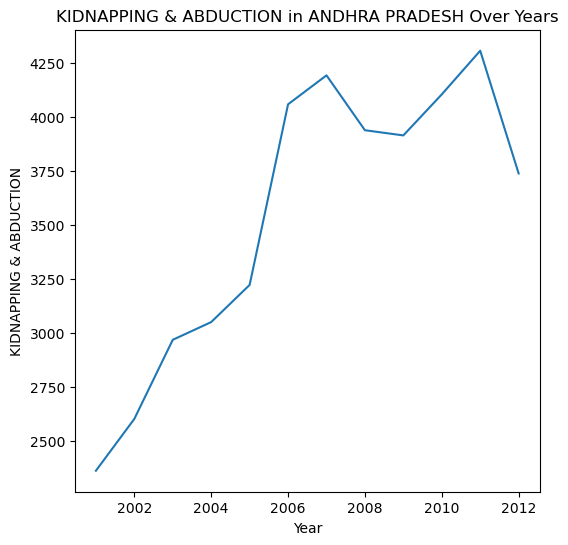

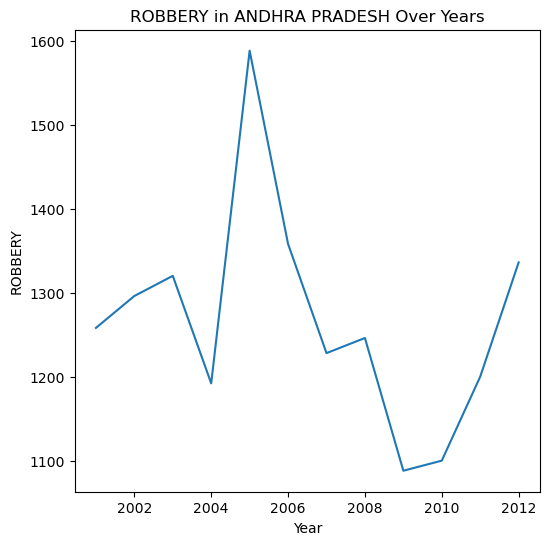

...

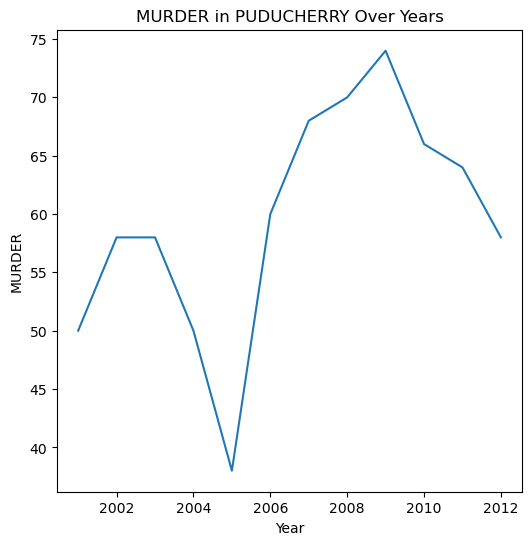

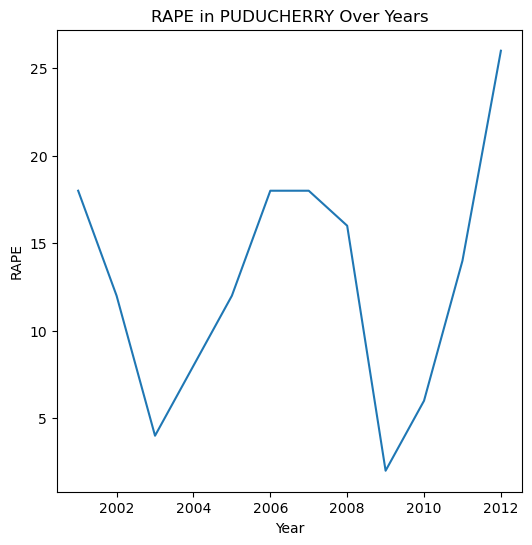

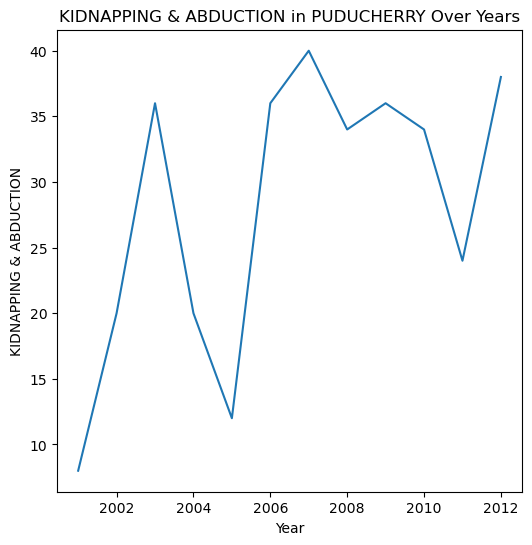

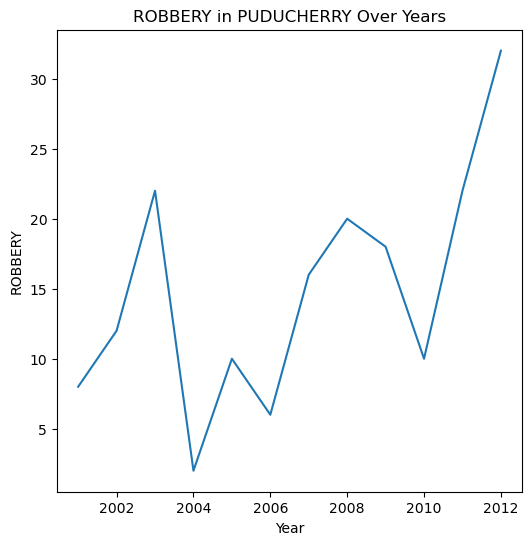

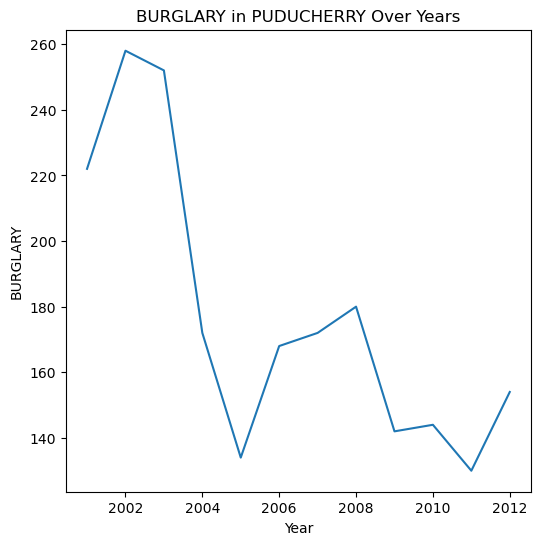

-----------------------------------------------------------------------


In [2]:
# ========================= PHASE 2 ===================================


# o	Analysis of Literacy Rate vs Total Crimes.


df = data1

df = df.dropna()

# Analysis 1: Literacy Rate vs Total Crimes
plt.figure(figsize=(6, 6))
sns.scatterplot(x='CAUSING DEATH BY NEGLIGENCE', y='TOTAL IPC CRIMES', data=df)
plt.title('Literacy Rate vs Total Crimes')
plt.xlabel('Literacy Rate (%)')
plt.ylabel('Total IPC Crimes')
plt.show()

print("-----------------------------------------------------------------------")

# o	Analysis of the type of crime vs each state vs Literacy rate.


crime_types = ['MURDER', 'RAPE', 'KIDNAPPING & ABDUCTION', 'ROBBERY', 'BURGLARY']  
for crime in crime_types:
    plt.figure(figsize=(7, 6))
    sns.boxplot(x='STATE/UT', y=crime, data=df)
    plt.title(f'{crime} vs State/UT')
    plt.xlabel('State/UT')
    plt.ylabel(crime)
    plt.xticks(rotation=90)
    plt.show()

print("-----------------------------------------------------------------------")


# o	Analysis of year-on-year total crime rate.

plt.figure(figsize=(6, 6))
sns.lineplot(x='YEAR', y='TOTAL IPC CRIMES', data=df)
plt.title('Year-on-Year Total IPC Crime Rate')
plt.xlabel('Year')
plt.ylabel('Total IPC Crimes')
plt.show()

print("-----------------------------------------------------------------------")

# o	Analysis of area vs overall crime.

plt.figure(figsize=(6, 6))
sns.scatterplot(x='DISTRICT', y='TOTAL IPC CRIMES', data=df)
plt.title('Area vs Overall Crime')
plt.xlabel('Area (sq km)')
plt.ylabel('Total IPC Crimes')
plt.show()


print("-----------------------------------------------------------------------")


# o	Analysis of Population vs overall Crime.


df = data5


# Analysis 5: Population vs overall crime
plt.figure(figsize=(6, 6))
sns.scatterplot(x='Grand total', y='CRIME', data=df)
plt.title('Population vs Overall IPC Crime')
plt.xlabel('Population')
plt.ylabel('Total IPC Crimes')
plt.show()

print("-----------------------------------------------------------------------")



# Analysis 6: Each state crime report


df =  data1


states = df['STATE/UT'].unique()
for state in states:
    state_data = df[df['STATE/UT'] == state]
    state_report = state_data.groupby('YEAR').agg({
        'TOTAL IPC CRIMES': 'sum',
        'MURDER': 'sum',
        'RAPE': 'sum',
        'KIDNAPPING & ABDUCTION': 'sum',
        'ROBBERY': 'sum',
        'BURGLARY': 'sum',
        # Add other crime types as necessary
    }).reset_index()
    
    # Plot total crimes over the years for the state
    plt.figure(figsize=(6, 6))
    sns.lineplot(x='YEAR', y='TOTAL IPC CRIMES', data=state_report)
    plt.title(f'Total IPC Crimes in {state} Over Years')
    plt.xlabel('Year')
    plt.ylabel('Total IPC Crimes')
    plt.show()

    # Plot other crime types over the years for the state
    for crime in crime_types:
        plt.figure(figsize=(6, 6))
        sns.lineplot(x='YEAR', y=crime, data=state_report)
        plt.title(f'{crime} in {state} Over Years')
        plt.xlabel('Year')
        plt.ylabel(crime)
        plt.show()

print("-----------------------------------------------------------------------")


In [3]:
# ========================= PHASE 3 ===================================



# --------------------------------------------------
# o	Write SQL query to find the highest number of rapes & Kidnappings that happened in which state, District, and year
# --------------------------------------------------


print("-------------------------------------------------------------------")
print("Write SQL query to find the highest number of rapes & Kidnappings ")
print("-------------------------------------------------------------------")
print()

import pandas as pd
import sqlite3

csv_file = 'Data/42_District_wise_crimes_committed_against_women_2001_2012.csv'
df = pd.read_csv(csv_file)

print(df.columns)

df = df[['STATE/UT', 'DISTRICT', 'Year', 'Rape', 'Kidnapping and Abduction']]

# Create SQLite connection
conn = sqlite3.connect('crimes.db')
cursor = conn.cursor()

# Create table
cursor.execute('''
    CREATE TABLE IF NOT EXISTS crimes (
        state TEXT,
        district TEXT,
        year INTEGER,
        rapes INTEGER,
        kidnappings INTEGER
    )
''')

# Insert DataFrame records one by one
for row in df.itertuples(index=False, name=None):
    cursor.execute('''
        INSERT INTO crimes (state, district, year, rapes, kidnappings)
        VALUES (?, ?, ?, ?, ?)
    ''', (row[0], row[1], row[2], row[3], row[4]))

# Commit the changes
conn.commit()

# Display the inserted table
print("Contents of the crimes table:")
for row in cursor.execute('SELECT * FROM crimes'):
    print(row)

# Query to find the highest number of rapes & kidnappings
highest_query = '''
    SELECT state, district, year, rapes, kidnappings
    FROM crimes
    WHERE (rapes = (SELECT MAX(rapes) FROM crimes) OR kidnappings = (SELECT MAX(kidnappings) FROM crimes));
'''

# Query to find the lowest number of rapes & kidnappings
lowest_query = '''
    SELECT state, district, year, rapes, kidnappings
    FROM crimes
    WHERE (rapes = (SELECT MIN(rapes) FROM crimes WHERE rapes > 0) OR kidnappings = (SELECT MIN(kidnappings) FROM crimes WHERE kidnappings > 0));
'''

# Execute and print the highest
cursor.execute(highest_query)
highest_results = cursor.fetchall()
print("\nHighest number of rapes & kidnappings:")
for row in highest_results:
    print(row)


-------------------------------------------------------------------
Write SQL query to find the highest number of rapes & Kidnappings 
-------------------------------------------------------------------

Index(['STATE/UT', 'DISTRICT', 'Year', 'Rape', 'Kidnapping and Abduction',
       'Dowry Deaths', 'Assault on women with intent to outrage her modesty',
       'Insult to modesty of Women', 'Cruelty by Husband or his Relatives',
       'Importation of Girls'],
      dtype='object')
Contents of the crimes table:
('ANDHRA PRADESH', 'ADILABAD', 2001, 50, 30)
('ANDHRA PRADESH', 'ANANTAPUR', 2001, 23, 30)
('ANDHRA PRADESH', 'CHITTOOR', 2001, 27, 34)
('ANDHRA PRADESH', 'CUDDAPAH', 2001, 20, 20)
('ANDHRA PRADESH', 'EAST GODAVARI', 2001, 23, 26)
('ANDHRA PRADESH', 'GUNTAKAL RLY.', 2001, 0, 0)
('ANDHRA PRADESH', 'GUNTUR', 2001, 54, 51)
('ANDHRA PRADESH', 'HYDERABAD CITY', 2001, 37, 39)
('ANDHRA PRADESH', 'KARIMNAGAR', 2001, 56, 49)
('ANDHRA PRADESH', 'KHAMMAM', 2001, 47, 30)
('ANDHRA PRADESH', 

In [4]:
# --------------------------------------------------
# o	o	Write SQL query to find All the lowest number of rapes & Kidnappings that happened in which state, District, and year.
# --------------------------------------------------

print("-------------------------------------------------------------------")
print("Write SQL query to find All the lowest number of rapes & Kidnappings ")
print("-------------------------------------------------------------------")
print()


# Execute and print the lowest
cursor.execute(lowest_query)
lowest_results = cursor.fetchall()
print("\nLowest number of rapes & kidnappings:")
for row in lowest_results:
    print(row)

# Close the connection
conn.close()


-------------------------------------------------------------------
Write SQL query to find All the lowest number of rapes & Kidnappings 
-------------------------------------------------------------------


Lowest number of rapes & kidnappings:
('ANDHRA PRADESH', 'VIJAYAWADA RLY.', 2001, 1, 0)
('ARUNACHAL PRADESH', 'CHANGLANG', 2001, 1, 2)
('ARUNACHAL PRADESH', 'SUBANSIRI UPPER', 2001, 2, 1)
('ARUNACHAL PRADESH', 'TAWANG', 2001, 1, 0)
('ARUNACHAL PRADESH', 'TIRAP', 2001, 1, 3)
('ASSAM', 'G.R.P.', 2001, 1, 0)
('BIHAR', 'BUXAR', 2001, 8, 1)
('BIHAR', 'JAMALPUR RLY.', 2001, 1, 0)
('BIHAR', 'JAMUI', 2001, 10, 1)
('BIHAR', 'KATIHAR RLY.', 2001, 0, 1)
('BIHAR', 'MUZAFFARPUR RLY.', 2001, 2, 1)
('BIHAR', 'NAWADAH', 2001, 15, 1)
('BIHAR', 'PATNA RLY.', 2001, 1, 1)
('BIHAR', 'SHEIKHPURA', 2001, 3, 1)
('CHHATTISGARH', 'BALRAMPUR', 2001, 17, 1)
('GOA', 'NORTH GOA', 2001, 4, 1)
('GUJARAT', 'AHWA-DANG', 2001, 1, 1)
('GUJARAT', 'W.RLY', 2001, 1, 0)
('HIMACHAL PRADESH', 'LAHAUL-SPITI', 2001, 2, 1)
('

In [5]:
# --------------------------------------------------
# o	Write SQL query to find the highest number of dacoity/robbery in which district
# --------------------------------------------------

print("--------------------------------------------------------------------------")
print("o	Write SQL query to find the highest number of dacoity/robbery in which district ")
print("-------------------------------------------------------------------")
print()


import pandas as pd
import sqlite3

# Load the CSV file into a DataFrame
csv_file = 'Data/02_District_wise_crimes_committed_against_ST_2001_2012.csv'
df = pd.read_csv(csv_file)

# Check the columns of the DataFrame
print(df.columns)

df = df[['DISTRICT', 'Year', 'Robbery', 'Murder']]

# Create SQLite connection
conn = sqlite3.connect('crimes.db')
cursor = conn.cursor()

# Create table for crimes against ST
cursor.execute('''
    CREATE TABLE IF NOT EXISTS crimes_against_st (
        district TEXT,
        year INTEGER,
        dacoity_robbery INTEGER,
        murder INTEGER
    )
''')

# Insert DataFrame records one by one
for row in df.itertuples(index=False, name=None):
    cursor.execute('''
        INSERT INTO crimes_against_st (district, year, dacoity_robbery, murder)
        VALUES (?, ?, ?, ?)
    ''', (row[0], row[1], row[2], row[3]))

# Commit the changes
conn.commit()

# Query to find the highest number of dacoity/robbery in which district
highest_dacoity_query = '''
    SELECT district, MAX(dacoity_robbery)
    FROM crimes_against_st;
'''

# Query to find in which districts(All) the lowest number of murders happened
lowest_murder_query = '''
    SELECT district, MIN(murder)
    FROM crimes_against_st;
'''

# Query to find the number of murders in ascending order in district and year wise
murders_asc_query = '''
    SELECT district, year, murder
    FROM crimes_against_st
    ORDER BY district, year;
'''



cursor.execute(highest_dacoity_query)
highest_dacoity_result = cursor.fetchone()
print("\nDistrict with the highest number of dacoity/robbery:")
print(highest_dacoity_result)



--------------------------------------------------------------------------
o	Write SQL query to find the highest number of dacoity/robbery in which district 
-------------------------------------------------------------------

Index(['STATE/UT', 'DISTRICT', 'Year', 'Murder', 'Rape',
       'Kidnapping Abduction', 'Dacoity', 'Robbery', 'Arson', 'Hurt',
       'Protection of Civil Rights (PCR) Act',
       'Prevention of atrocities (POA) Act', 'Other Crimes Against STs'],
      dtype='object')

District with the highest number of dacoity/robbery:
('TOTAL', 34)


In [6]:
print("--------------------------------------------------------------------------")
print("o	Write SQL query to find in which districts(All) the lowest number of murders happened.")
print("-------------------------------------------------------------------")
print()


cursor.execute(lowest_murder_query)
lowest_murder_result = cursor.fetchall()
print("\nDistricts with the lowest number of murders:")
print(lowest_murder_result)


--------------------------------------------------------------------------
o	Write SQL query to find in which districts(All) the lowest number of murders happened.
-------------------------------------------------------------------


Districts with the lowest number of murders:
[('ADILABAD', 0)]


In [7]:
print("--------------------------------------------------------------------------")
print("o	Write SQL query to find the number of murders in ascending order in district and year wise.")
print("-------------------------------------------------------------------")
print()




cursor.execute(murders_asc_query)
murders_asc_result = cursor.fetchall()
print("\nNumber of murders in ascending order in district and year wise:")
for row in murders_asc_result:
    print(row)

# Close the connection
conn.close()


--------------------------------------------------------------------------
o	Write SQL query to find the number of murders in ascending order in district and year wise.
-------------------------------------------------------------------


Number of murders in ascending order in district and year wise:
('24 PARGANAS NORTH', 2001, 0)
('24 PARGANAS NORTH', 2002, 0)
('24 PARGANAS NORTH', 2003, 0)
('24 PARGANAS NORTH', 2004, 0)
('24 PARGANAS NORTH', 2005, 0)
('24 PARGANAS NORTH', 2006, 0)
('24 PARGANAS NORTH', 2007, 0)
('24 PARGANAS NORTH', 2008, 0)
('24 PARGANAS NORTH', 2009, 0)
('24 PARGANAS NORTH', 2010, 0)
('24 PARGANAS NORTH', 2011, 0)
('24 PARGANAS NORTH', 2012, 0)
('24 PARGANAS SOUTH', 2001, 0)
('24 PARGANAS SOUTH', 2002, 0)
('24 PARGANAS SOUTH', 2003, 0)
('24 PARGANAS SOUTH', 2004, 0)
('24 PARGANAS SOUTH', 2005, 0)
('24 PARGANAS SOUTH', 2006, 0)
('24 PARGANAS SOUTH', 2007, 0)
('24 PARGANAS SOUTH', 2008, 0)
('24 PARGANAS SOUTH', 2009, 0)
('24 PARGANAS SOUTH', 2010, 0)
('24 PARGANAS S

In [8]:
# Load the CSV file into a DataFrame
csv_file = 'Data/01_District_wise_crimes_committed_IPC_2001_2012.csv'
df = pd.read_csv(csv_file)

# Select required columns
df_selected = df[['STATE/UT', 'DISTRICT', 'YEAR', 'MURDER', 'ATTEMPT TO MURDER', 'RAPE']]

# Create SQLite connection
conn = sqlite3.connect('crimes.db')
cursor = conn.cursor()

# Create table for selected columns
cursor.execute('''
    CREATE TABLE IF NOT EXISTS crimes_selected (
        state_ut TEXT,
        district TEXT,
        year INTEGER,
        murder INTEGER,
        attempt_murder INTEGER,
        rape INTEGER
    )
''')

# Insert DataFrame records one by one
for row in df_selected.itertuples(index=False, name=None):
    cursor.execute('''
        INSERT INTO crimes_selected (state_ut, district, year, murder, attempt_murder, rape)
        VALUES (?, ?, ?, ?, ?, ?)
    ''', (row[0], row[1], row[2], row[3], row[4], row[5]))

# Commit the changes
conn.commit()

# Write SQL query to find which District in each state/UT has the highest number of murders year wise
highest_murders_query = '''
    SELECT state_ut, year, district, MAX(murder) AS murders
    FROM crimes_selected
    GROUP BY state_ut, year;
'''

# Execute the query
cursor.execute(highest_murders_query)
highest_murders_result = cursor.fetchall()


# --------------------------------------------------
# o	Write SQL query to find the highest number of murders year wise
# --------------------------------------------------




print("\nhighest number of murders year wise")
for row in highest_murders_result:
    print(row)



highest number of murders year wise
('A & N ISLANDS', 2001, 'ANDAMAN', 13)
('A & N ISLANDS', 2002, 'TOTAL', 17)
('A & N ISLANDS', 2003, 'TOTAL', 21)
('A & N ISLANDS', 2004, 'TOTAL', 15)
('A & N ISLANDS', 2005, 'ANDAMAN', 14)
('A & N ISLANDS', 2006, 'TOTAL', 4)
('A & N ISLANDS', 2007, 'A and N ISLANDS', 15)
('A & N ISLANDS', 2008, 'ANDAMAN', 8)
('A & N ISLANDS', 2009, 'ANDAMAN', 15)
('A & N ISLANDS', 2010, 'TOTAL', 9)
('A & N ISLANDS', 2011, 'ANDAMAN', 14)
('A & N ISLANDS', 2012, 'TOTAL', 15)
('ANDHRA PRADESH', 2001, 'TOTAL', 2602)
('ANDHRA PRADESH', 2002, 'TOTAL', 2525)
('ANDHRA PRADESH', 2003, 'TOTAL', 2667)
('ANDHRA PRADESH', 2004, 'TOTAL', 2579)
('ANDHRA PRADESH', 2005, 'TOTAL', 2750)
('ANDHRA PRADESH', 2006, 'TOTAL', 2766)
('ANDHRA PRADESH', 2007, 'TOTAL', 2665)
('ANDHRA PRADESH', 2008, 'TOTAL', 2690)
('ANDHRA PRADESH', 2009, 'TOTAL', 2449)
('ANDHRA PRADESH', 2010, 'TOTAL', 2538)
('ANDHRA PRADESH', 2011, 'TOTAL', 2808)
('ANDHRA PRADESH', 2012, 'TOTAL', 2717)
('ARUNACHAL PRADESH', 

In [9]:
# ----------------- STORED 

df_result = pd.DataFrame(highest_murders_result, columns=['STATE/UT', 'YEAR', 'DISTRICT', 'MURDERS'])

# Filter districts  3 or more than 3 years
districts_more_than_3_years = df_result['DISTRICT'].value_counts()[df_result['DISTRICT'].value_counts() >= 3].index.tolist()
df_filtered = df_result[df_result['DISTRICT'].isin(districts_more_than_3_years)]

# Sort DataFrame  year in descending order
df_filtered_sorted = df_filtered.sort_values(by=['YEAR'], ascending=False)

# --------------------------------------------------
# o	Filtered Data Frame
# --------------------------------------------------




# Print the filtered DataFrame
print("Filtered DataFrame:")
print(df_filtered_sorted)

# Close the connection
conn.close()


Filtered DataFrame:
              STATE/UT  YEAR DISTRICT  MURDERS
419        WEST BENGAL  2012    TOTAL     2252
59               BIHAR  2012    TOTAL     3566
239     MADHYA PRADESH  2012    TOTAL     2373
35   ARUNACHAL PRADESH  2012    TOTAL       73
155            HARYANA  2012    TOTAL      991
..                 ...   ...      ...      ...
252            MANIPUR  2001    TOTAL      209
36               ASSAM  2001    TOTAL     1356
384      UTTAR PRADESH  2001    TOTAL     7601
240        MAHARASHTRA  2001    TOTAL     2839
0        A & N ISLANDS  2001  ANDAMAN       13

[418 rows x 4 columns]


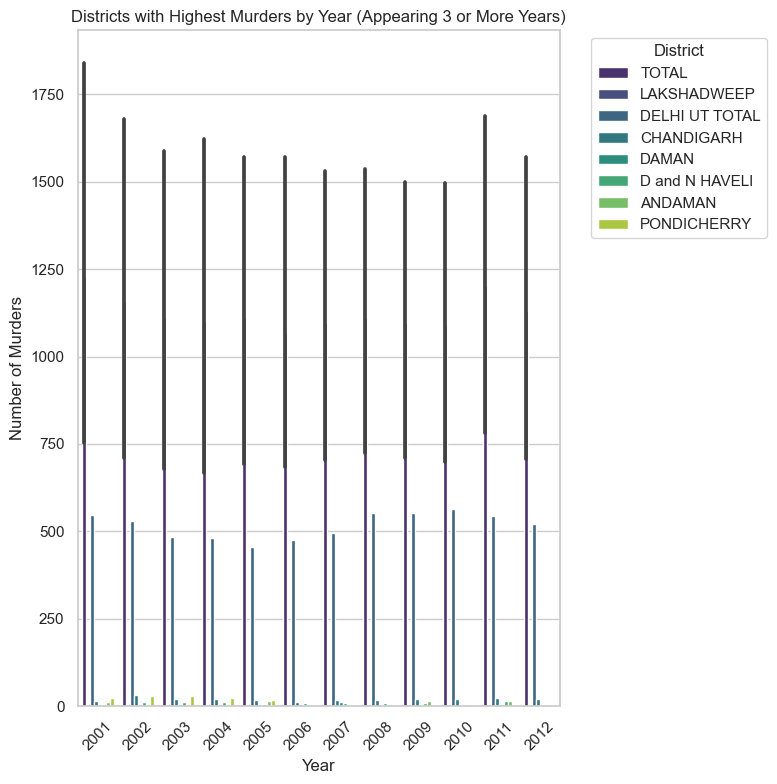

In [10]:
# ------------ GRAPH


import matplotlib.pyplot as plt
import seaborn as sns
# Plot the data
plt.figure(figsize=(8, 8))
sns.set(style="whitegrid")

# Create a bar plot
bar_plot = sns.barplot(x='YEAR', y='MURDERS', hue='DISTRICT', data=df_filtered_sorted, palette='viridis')

# Customize the plot
plt.title('Districts with Highest Murders by Year (Appearing 3 or More Years)')
plt.xlabel('Year')
plt.ylabel('Number of Murders')
plt.legend(title='District', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xticks(rotation=45)
plt.tight_layout()

# Show the plot
plt.show()

Sensitive Areas:
         STATE/UT DISTRICT  YEAR  MURDER  ATTEMPT TO MURDER  \
70          ASSAM    TOTAL  2001    1356                481   
115         BIHAR    TOTAL  2001    3643               3419   
135  CHHATTISGARH    TOTAL  2001     880                529   
169       GUJARAT    TOTAL  2001    1226                537   
190       HARYANA    TOTAL  2001     781                467   

     CULPABLE HOMICIDE NOT AMOUNTING TO MURDER  RAPE  CUSTODIAL RAPE  \
70                                          40   817               0   
115                                        250   888               0   
135                                         45   959               0   
169                                         94   286               0   
190                                         78   398               0   

     OTHER RAPE  KIDNAPPING & ABDUCTION  ...  DOWRY DEATHS  \
70          817                    1480  ...            59   
115         888                    2159  ...   

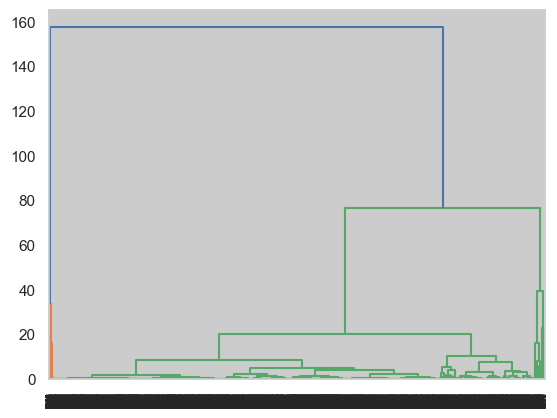

In [11]:
# =========================== PHASE 4 =======================================


import pandas as pd
import numpy as np
import scipy.cluster.hierarchy as sch

# Load the data
csv_file = 'Data/01_District_wise_crimes_committed_IPC_2001_2012.csv'
df = pd.read_csv(csv_file)

# Drop rows with missing values
df.dropna(inplace=True)

# Select relevant features for clustering
X = df[['TOTAL IPC CRIMES', 'CAUSING DEATH BY NEGLIGENCE']]

# Standardize the features
X = (X - X.mean()) / X.std()

# Perform hierarchical clustering
dendrogram = sch.dendrogram(sch.linkage(X, method='ward'))

# Visualize the dendrogram to determine the number of clusters
# Adjust the number of clusters based on the dendrogram
# Based on the dendrogram, we'll assume 3 clusters

# Perform agglomerative hierarchical clustering
from sklearn.cluster import AgglomerativeClustering
num_clusters = 3
cluster = AgglomerativeClustering(n_clusters=num_clusters, linkage='ward')
cluster_labels = cluster.fit_predict(X)

# Add the cluster labels to the dataframe
df['Cluster'] = cluster_labels

# Define cluster names
cluster_names = {0: 'Sensitive Area', 1: 'Moderate Area', 2: 'Peaceful Area'}

# Assign cluster names based on the labels
df['Cluster Name'] = df['Cluster'].map(cluster_names)

# Create separate DataFrames for each cluster
df_sensitive = df[df['Cluster Name'] == 'Sensitive Area']
df_moderate = df[df['Cluster Name'] == 'Moderate Area']
df_peaceful = df[df['Cluster Name'] == 'Peaceful Area']

# Print or analyze the DataFrames for each cluster as needed
print("Sensitive Areas:")
print(df_sensitive.head())

print("\nModerate Areas:")
print(df_moderate.head())

print("\nPeaceful Areas:")
print(df_peaceful.head())


In [12]:
# Assign cluster names based on the labels
df['Cluster Name'] = df['Cluster'].map(cluster_names)

# Create separate DataFrames for each cluster
df_sensitive = df[df['Cluster Name'] == 'Sensitive Area']
df_moderate = df[df['Cluster Name'] == 'Moderate Area']
df_peaceful = df[df['Cluster Name'] == 'Peaceful Area']

# Print or analyze the DataFrames for each cluster as needed
print("Sensitive Areas:")
print(df_sensitive.head())

print("\nModerate Areas:")
print(df_moderate.head())

print("\nPeaceful Areas:")
print(df_peaceful.head())

Sensitive Areas:
         STATE/UT DISTRICT  YEAR  MURDER  ATTEMPT TO MURDER  \
70          ASSAM    TOTAL  2001    1356                481   
115         BIHAR    TOTAL  2001    3643               3419   
135  CHHATTISGARH    TOTAL  2001     880                529   
169       GUJARAT    TOTAL  2001    1226                537   
190       HARYANA    TOTAL  2001     781                467   

     CULPABLE HOMICIDE NOT AMOUNTING TO MURDER  RAPE  CUSTODIAL RAPE  \
70                                          40   817               0   
115                                        250   888               0   
135                                         45   959               0   
169                                         94   286               0   
190                                         78   398               0   

     OTHER RAPE  KIDNAPPING & ABDUCTION  ...  DOWRY DEATHS  \
70          817                    1480  ...            59   
115         888                    2159  ...   